In [116]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from auxiliar_functions import *
from sklearn.ensemble import IsolationForest

- Lectura y procesamiento del dataset

In [117]:
df_data = pd.read_csv("gdm_first_trimester_ml_dataset.csv")
df_data.head(5)

,age_years,bmi_prepreg_kg_m2,systolic_bp_mmHg,diastolic_bp_mmHg,map_mmHg,gestational_weeks,fpg_mmol_l,hba1c_percent,insulin_uIU_ml,homa_ir,triglycerides_mmol_l,hdl_mmol_l,parity,family_history_t2d,previous_gdm,pcos,smoking_first_trimester,physical_activity_level,diet_score_0_100,label_gdm
0,26.8,26.9,119.0,57.0,77.7,8.7,4.10,5.33,7.8,1.42,1.37,1.36,0,0,1,0,1,2.0,62.0,0
1,22.6,27.3,NaN,69.0,80.8,9.0,3.53,5.73,7.2,1.12,1.13,1.60,0,1,0,1,0,1.0,42.0,0
2,29.9,33.1,103.0,84.0,89.9,10.3,4.45,NaN,4.3,0.86,1.27,1.16,0,1,0,0,0,1.0,72.0,0
3,26.3,23.6,112.0,69.0,83.3,12.2,4.79,4.69,13.7,2.91,1.22,1.73,0,0,0,0,0,0.0,81.0,0
4,31.9,31.0,117.0,69.0,84.9,8.9,NaN,5.12,9.5,2.23,2.45,1.50,1,0,0,0,0,2.0,53.0,0


In [118]:
df_data.shape

(1500, 20)

In [119]:
df_data["label_gdm"].value_counts()

label_gdm
0    1239
1     261
Name: count, dtype: int64

In [120]:
df_data.dtypes

age_years                  float64
bmi_prepreg_kg_m2          float64
systolic_bp_mmHg           float64
diastolic_bp_mmHg          float64
map_mmHg                   float64
gestational_weeks          float64
fpg_mmol_l                 float64
hba1c_percent              float64
insulin_uIU_ml             float64
homa_ir                    float64
triglycerides_mmol_l       float64
hdl_mmol_l                 float64
parity                       int64
family_history_t2d           int64
previous_gdm                 int64
pcos                         int64
smoking_first_trimester      int64
physical_activity_level    float64
diet_score_0_100           float64
label_gdm                    int64
dtype: object

In [121]:
df_data["pcos"].unique().shape

(2,)

In [122]:
df_data.isna().astype(int)

,age_years,bmi_prepreg_kg_m2,systolic_bp_mmHg,diastolic_bp_mmHg,map_mmHg,gestational_weeks,fpg_mmol_l,hba1c_percent,insulin_uIU_ml,homa_ir,triglycerides_mmol_l,hdl_mmol_l,parity,family_history_t2d,previous_gdm,pcos,smoking_first_trimester,physical_activity_level,diet_score_0_100,label_gdm
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


In [123]:
df_nulls = df_data.isna().astype(int)

df_summary_null = generate_df_counts(df_nulls, columns_name=["descriptor", "count_Nulls", "count_Falses"])
df_summary_null

,descriptor,count_Nulls,count_Falses
0,age_years,0,1500
1,bmi_prepreg_kg_m2,0,1500
2,systolic_bp_mmHg,45,1455
3,diastolic_bp_mmHg,36,1464
4,map_mmHg,0,1500
5,gestational_weeks,0,1500
6,fpg_mmol_l,109,1391
7,hba1c_percent,162,1338
8,insulin_uIU_ml,108,1392
9,homa_ir,0,1500


In [124]:
df_nulls

,age_years,bmi_prepreg_kg_m2,systolic_bp_mmHg,diastolic_bp_mmHg,map_mmHg,gestational_weeks,fpg_mmol_l,hba1c_percent,insulin_uIU_ml,homa_ir,triglycerides_mmol_l,hdl_mmol_l,parity,family_history_t2d,previous_gdm,pcos,smoking_first_trimester,physical_activity_level,diet_score_0_100,label_gdm
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


- Estadística descriptiva

In [125]:
columns_to_ignore = [
    "parity", 
    "family_history_t2d",
    "previous_gdm",
    "pcos", 
    "smoking_first_trimester",
    "label_gdm",
    "physical_activity_level"
]

In [126]:
df_data.describe()

,age_years,bmi_prepreg_kg_m2,systolic_bp_mmHg,diastolic_bp_mmHg,map_mmHg,gestational_weeks,fpg_mmol_l,hba1c_percent,insulin_uIU_ml,homa_ir,triglycerides_mmol_l,hdl_mmol_l,parity,family_history_t2d,previous_gdm,pcos,smoking_first_trimester,physical_activity_level,diet_score_0_100,label_gdm
count,1500.000000,1500.000000,1455.000000,1464.000000,1500.000000,1500.000000,1391.000000,1338.000000,1392.000000,1500.000000,1352.000000,1414.000000,1500.000000,1500.000000,1500.000000,1500.000000,1500.000000,1430.000000,1431.000000,1500.000000
mean,29.129600,26.284738,112.029553,70.535519,84.398244,10.811667,4.801589,5.218923,10.990520,2.394468,1.612710,1.482150,1.001333,0.304667,0.099333,0.099333,0.112667,0.861538,64.823201,0.174000
std,4.988332,5.005360,12.254459,8.516566,7.215258,1.611753,0.977795,0.376506,4.487567,1.683579,0.705940,0.331403,0.987580,0.460420,0.299209,0.299209,0.316290,0.723776,12.217272,0.379236
min,16.000000,16.000000,80.000000,45.000000,61.100000,8.000000,3.200000,4.500000,3.200000,0.490000,0.510000,0.300000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,21.000000,0.000000
25%,25.600000,22.900000,104.000000,65.000000,79.700000,9.400000,4.300000,5.000000,8.075000,1.640000,1.167500,1.270000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,57.000000,0.000000
50%,29.100000,26.350000,112.000000,70.000000,84.300000,10.800000,4.710000,5.200000,10.200000,2.120000,1.485000,1.500000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,65.000000,0.000000
75%,32.525000,29.400000,120.000000,76.000000,88.900000,12.200000,5.150000,5.400000,12.900000,2.720000,1.900000,1.700000,2.000000,1.000000,0.000000,0.000000,0.000000,1.000000,73.000000,0.000000
max,44.200000,48.475791,165.000000,100.000000,117.333333,13.600000,14.420883,7.856413,54.377082,24.530822,9.262292,2.510000,5.000000,1.000000,1.000000,1.000000,1.000000,2.000000,100.000000,1.000000


In [127]:
statistical_descriptors = []

for column in df_data.columns:
    if column not in columns_to_ignore:
        descriptive_values = df_data[column].describe()

        IQR = descriptive_values["75%"] - descriptive_values["25%"]
        min_value, max_value = get_range_outlier(
            descriptive_values["25%"], 
            descriptive_values["75%"], 
            IQR)

        row = {
            "descriptor" : column,
            "mean":descriptive_values["mean"],
            "std" :descriptive_values["std"],
            "median" : descriptive_values["50%"],
            "IQR" : IQR,
            "25%" : descriptive_values["25%"],
            "75%" :descriptive_values["75%"],
            "min_value_for_outlier" : min_value,
            "max_value_for_outlier" : max_value

        }
        statistical_descriptors.append(row)

df_statistical = pd.DataFrame(statistical_descriptors)
df_statistical

,descriptor,mean,std,median,IQR,25%,75%,min_value_for_outlier,max_value_for_outlier
0,age_years,29.129600,4.988332,29.100,6.9250,25.6000,32.525,15.21250,42.91250
1,bmi_prepreg_kg_m2,26.284738,5.005360,26.350,6.5000,22.9000,29.400,13.15000,39.15000
2,systolic_bp_mmHg,112.029553,12.254459,112.000,16.0000,104.0000,120.000,80.00000,144.00000
3,diastolic_bp_mmHg,70.535519,8.516566,70.000,11.0000,65.0000,76.000,48.50000,92.50000
4,map_mmHg,84.398244,7.215258,84.300,9.2000,79.7000,88.900,65.90000,102.70000
5,gestational_weeks,10.811667,1.611753,10.800,2.8000,9.4000,12.200,5.20000,16.40000
6,fpg_mmol_l,4.801589,0.977795,4.710,0.8500,4.3000,5.150,3.02500,6.42500
7,hba1c_percent,5.218923,0.376506,5.200,0.4000,5.0000,5.400,4.40000,6.00000
8,insulin_uIU_ml,10.990520,4.487567,10.200,4.8250,8.0750,12.900,0.83750,20.13750
9,homa_ir,2.394468,1.683579,2.120,1.0800,1.6400,2.720,0.02000,4.34000


- Deteccion de outliers

In [128]:
df_outliers = pd.DataFrame()

for column in df_data.columns:
    if column not in columns_to_ignore:
        
        df_filter = df_statistical[df_statistical["descriptor"] == column]
        df_filter.reset_index(inplace=True)

        min_value, max_value = df_filter["min_value_for_outlier"][0], df_filter["max_value_for_outlier"][0]

        df_outliers[column] = df_data[column].apply(lambda x: check_is_outlier(x, min_value, max_value))

In [129]:
df_outliers = df_outliers.astype(int)
df_summary_outlier = generate_df_counts(df_outliers, columns_name=["descriptor", "count_Outlier", "count_NotOutlier"])
df_summary_outlier

,descriptor,count_Outlier,count_NotOutlier
0,age_years,5,1495
1,bmi_prepreg_kg_m2,13,1487
2,systolic_bp_mmHg,9,1491
3,diastolic_bp_mmHg,18,1482
4,map_mmHg,23,1477
5,gestational_weeks,0,1500
6,fpg_mmol_l,24,1476
7,hba1c_percent,24,1476
8,insulin_uIU_ml,46,1454
9,homa_ir,59,1441


In [130]:
df_outliers

,age_years,bmi_prepreg_kg_m2,systolic_bp_mmHg,diastolic_bp_mmHg,map_mmHg,gestational_weeks,fpg_mmol_l,hba1c_percent,insulin_uIU_ml,homa_ir,triglycerides_mmol_l,hdl_mmol_l,diet_score_0_100
0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,1,1,0,0,0,1,1,1,1,1,0,0
1496,0,0,0,1,1,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,1,0,0


In [131]:
df_outliers.columns

Index(['age_years', 'bmi_prepreg_kg_m2', 'systolic_bp_mmHg',
       'diastolic_bp_mmHg', 'map_mmHg', 'gestational_weeks', 'fpg_mmol_l',
       'hba1c_percent', 'insulin_uIU_ml', 'homa_ir', 'triglycerides_mmol_l',
       'hdl_mmol_l', 'diet_score_0_100'],
      dtype='object')

In [132]:
df_outliers["triglycerides_mmol_l"].value_counts()

triglycerides_mmol_l
0    1455
1      45
Name: count, dtype: int64

In [133]:
df_outliers["outlier_by_IQR"] = df_outliers.sum(axis=1)
df_outliers["outlier_by_IQR"].value_counts()

outlier_by_IQR
0    1347
1     101
2      28
6       8
7       5
5       4
4       2
3       2
9       2
8       1
Name: count, dtype: int64

- Análisis de proporciones en función de datos categóricos

In [134]:
df_data[df_data["parity"] == 5]

,age_years,bmi_prepreg_kg_m2,systolic_bp_mmHg,diastolic_bp_mmHg,map_mmHg,gestational_weeks,fpg_mmol_l,hba1c_percent,insulin_uIU_ml,homa_ir,triglycerides_mmol_l,hdl_mmol_l,parity,family_history_t2d,previous_gdm,pcos,smoking_first_trimester,physical_activity_level,diet_score_0_100,label_gdm
24,36.9,28.4,116.0,54.0,74.7,12.0,4.56,4.58,NaN,1.51,1.46,1.75,5,0,0,0,0,NaN,NaN,0
1207,28.5,23.9,119.0,71.0,86.8,13.5,5.56,4.91,12.8,3.18,0.96,1.82,5,0,0,1,0,0.0,62.0,0
1273,29.5,27.7,94.0,64.0,74.1,10.1,4.97,5.16,NaN,1.49,1.74,1.16,5,1,0,0,1,1.0,63.0,1
1368,28.1,20.5,90.0,66.0,74.3,12.7,4.65,5.94,10.4,2.15,NaN,1.95,5,0,0,0,0,1.0,75.0,0


In [135]:
for column in columns_to_ignore:
    print(df_data[column].value_counts())

parity
1    561
0    545
2    269
3    101
4     20
5      4
Name: count, dtype: int64
family_history_t2d
0    1043
1     457
Name: count, dtype: int64
previous_gdm
0    1351
1     149
Name: count, dtype: int64
pcos
0    1351
1     149
Name: count, dtype: int64
smoking_first_trimester
0    1331
1     169
Name: count, dtype: int64
label_gdm
0    1239
1     261
Name: count, dtype: int64
physical_activity_level
1.0    654
0.0    487
2.0    289
Name: count, dtype: int64


In [136]:
data_categorical = df_data[columns_to_ignore]
data_categorical = data_categorical.drop(columns=["label_gdm"])

In [137]:
isolation_instance = IsolationForest(random_state=42)
isolation_instance.fit(data_categorical)
data_categorical["is_isolated"] = isolation_instance.predict(data_categorical)
data_categorical["is_isolated"].value_counts()

is_isolated
 1    953
-1    547
Name: count, dtype: int64

In [138]:
data_categorical

,parity,family_history_t2d,previous_gdm,pcos,smoking_first_trimester,physical_activity_level,is_isolated
0,0,0,1,0,1,2.0,-1
1,0,1,0,1,0,1.0,-1
2,0,1,0,0,0,1.0,1
3,0,0,0,0,0,0.0,1
4,1,0,0,0,0,2.0,1
...,...,...,...,...,...,...,...
1495,1,0,0,0,0,1.0,1
1496,0,0,1,0,0,0.0,-1
1497,2,0,0,0,1,2.0,-1
1498,0,0,1,0,0,0.0,-1


In [139]:
df_values = df_data.drop(columns=columns_to_ignore)

isolation_instance = IsolationForest(random_state=42)
isolation_instance.fit(df_values)
df_values["is_isolated"] = isolation_instance.predict(df_values)
df_values["is_isolated"].value_counts()

is_isolated
 1    1424
-1      76
Name: count, dtype: int64

In [140]:
df_values_cat = df_data.drop(columns=["label_gdm"])

isolation_instance = IsolationForest(random_state=42)
isolation_instance.fit(df_values_cat)
df_values_cat["is_isolated"] = isolation_instance.predict(df_values_cat)
df_values_cat["is_isolated"].value_counts()

is_isolated
 1    1315
-1     185
Name: count, dtype: int64

In [141]:
df_data["is_outlier_by_IQR"] = df_outliers["outlier_by_IQR"].values
df_data["is_outlier_by_IF_all"] = df_values_cat["is_isolated"].values
df_data["is_outlier_by_IF_just_values"] = df_values["is_isolated"].values
df_data["is_outlier_by_IF_just_cat"] = data_categorical["is_isolated"].values

In [142]:
df_data

,age_years,bmi_prepreg_kg_m2,systolic_bp_mmHg,diastolic_bp_mmHg,map_mmHg,gestational_weeks,fpg_mmol_l,hba1c_percent,insulin_uIU_ml,homa_ir,...,previous_gdm,pcos,smoking_first_trimester,physical_activity_level,diet_score_0_100,label_gdm,is_outlier_by_IQR,is_outlier_by_IF_all,is_outlier_by_IF_just_values,is_outlier_by_IF_just_cat
0,26.8,26.900000,119.0,57.0,77.7,8.7,4.100000,5.330000,7.800000,1.420000,...,1,0,1,2.0,62.0,0,0,-1,1,-1
1,22.6,27.300000,NaN,69.0,80.8,9.0,3.530000,5.730000,7.200000,1.120000,...,0,1,0,1.0,42.0,0,0,-1,1,-1
2,29.9,33.100000,103.0,84.0,89.9,10.3,4.450000,NaN,4.300000,0.860000,...,0,0,0,1.0,72.0,0,0,1,1,1
3,26.3,23.600000,112.0,69.0,83.3,12.2,4.790000,4.690000,13.700000,2.910000,...,0,0,0,0.0,81.0,0,0,1,1,1
4,31.9,31.000000,117.0,69.0,84.9,8.9,NaN,5.120000,9.500000,2.230000,...,0,0,0,2.0,53.0,0,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,16.0,44.281931,152.0,74.0,100.0,13.1,12.549164,7.184281,35.447597,19.770565,...,0,0,0,1.0,57.0,0,7,-1,-1,1
1496,23.0,26.000000,101.0,47.0,65.0,8.3,4.130000,4.830000,6.800000,1.260000,...,1,0,0,0.0,57.0,0,2,-1,1,-1
1497,27.6,25.300000,110.0,67.0,81.5,8.4,4.600000,5.470000,10.900000,2.240000,...,0,0,1,2.0,58.0,0,0,1,1,-1
1498,38.4,26.700000,114.0,73.0,86.7,9.2,4.280000,5.390000,10.700000,2.030000,...,1,0,0,0.0,71.0,0,1,1,1,-1


In [143]:
df_data["is_outlier_by_IQR"] = df_data["is_outlier_by_IQR"].apply(categorize_iqr)
df_data["is_outlier_by_IQR"].value_counts()

is_outlier_by_IQR
0    1347
1     153
Name: count, dtype: int64

In [144]:
for column in ["is_outlier_by_IF_all", "is_outlier_by_IF_just_values", "is_outlier_by_IF_just_cat"]:
    df_data[column] = df_data[column].replace({1:0, -1:1})

In [145]:
df_data["is_outlier_by_IF_all"].value_counts()

is_outlier_by_IF_all
0    1315
1     185
Name: count, dtype: int64

In [146]:
df_data["vote_outlier"] = df_data[["is_outlier_by_IF_all", "is_outlier_by_IF_just_values", "is_outlier_by_IF_just_cat", "is_outlier_by_IQR"]].sum(axis=1)
df_data["vote_outlier"].value_counts()

vote_outlier
0    843
1    431
2    162
3     50
4     14
Name: count, dtype: int64

In [147]:
df_data[df_data["vote_outlier"] ==4]

,age_years,bmi_prepreg_kg_m2,systolic_bp_mmHg,diastolic_bp_mmHg,map_mmHg,gestational_weeks,fpg_mmol_l,hba1c_percent,insulin_uIU_ml,homa_ir,...,pcos,smoking_first_trimester,physical_activity_level,diet_score_0_100,label_gdm,is_outlier_by_IQR,is_outlier_by_IF_all,is_outlier_by_IF_just_values,is_outlier_by_IF_just_cat,vote_outlier
86,28.7,37.582304,140.0,87.0,104.666667,12.2,8.593830,7.856413,26.989382,10.308541,...,0,0,0.0,84.0,0,1,1,1,1,4
135,16.0,25.800000,120.0,73.0,88.900000,11.7,5.710000,5.370000,18.400000,4.680000,...,1,0,2.0,56.0,0,1,1,1,1,4
214,37.6,16.600000,130.0,83.0,98.900000,12.8,4.350000,4.820000,9.400000,1.820000,...,1,0,0.0,61.0,0,1,1,1,1,4
312,23.0,41.854684,145.0,82.0,103.000000,10.5,8.473221,7.403294,16.784041,6.320662,...,1,0,1.0,NaN,0,1,1,1,1,4
439,29.8,27.771737,146.0,70.0,95.333333,13.2,9.933789,6.660425,25.787151,11.385072,...,0,0,0.0,84.0,0,1,1,1,1,4
535,28.9,19.100000,98.0,74.0,82.100000,8.1,6.060000,5.210000,16.900000,4.550000,...,0,1,1.0,51.0,0,1,1,1,1,4
587,28.9,27.169719,137.0,79.0,98.333333,9.3,10.550126,6.338301,28.839151,13.522519,...,0,1,1.0,53.0,0,1,1,1,1,4
968,23.1,39.615159,157.0,75.0,102.333333,8.8,11.725564,7.770382,47.071808,24.530822,...,0,1,0.0,70.0,0,1,1,1,1,4
1027,17.1,23.800000,114.0,63.0,80.300000,13.2,4.870000,4.870000,23.600000,5.100000,...,0,1,0.0,53.0,0,1,1,1,1,4
1107,33.2,33.900000,80.0,55.0,63.300000,10.8,5.080000,5.250000,10.600000,2.380000,...,1,0,0.0,62.0,0,1,1,1,1,4


- Filtramos outliers por estrategia de votación

In [148]:
df_filter = df_data[df_data["vote_outlier"]<3]
df_filter.shape

(1436, 25)

- Visualización de los datos

In [149]:
df_statistical["descriptor"].values

array(['age_years', 'bmi_prepreg_kg_m2', 'systolic_bp_mmHg',
       'diastolic_bp_mmHg', 'map_mmHg', 'gestational_weeks', 'fpg_mmol_l',
       'hba1c_percent', 'insulin_uIU_ml', 'homa_ir',
       'triglycerides_mmol_l', 'hdl_mmol_l', 'diet_score_0_100'],
      dtype=object)

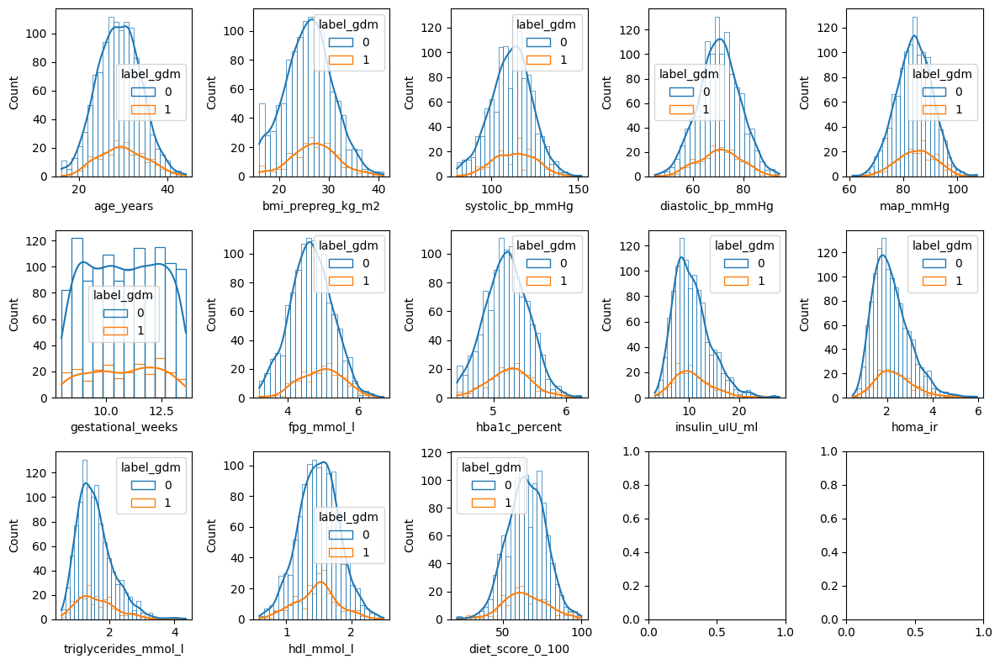

In [150]:
_, axis = plt.subplots(3,5, figsize=(12,8))

index=1
i=0
j=0

for column in df_statistical["descriptor"].values:
    sns.histplot(
        data=df_filter, 
        x=column, 
        stat="count",
        fill=False, 
        kde=True, 
        hue="label_gdm", 
        ax=axis[i][j])

    if index%5==0:
        i+=1
        j=0
    else:
        j+=1
    
    index+=1

plt.tight_layout()

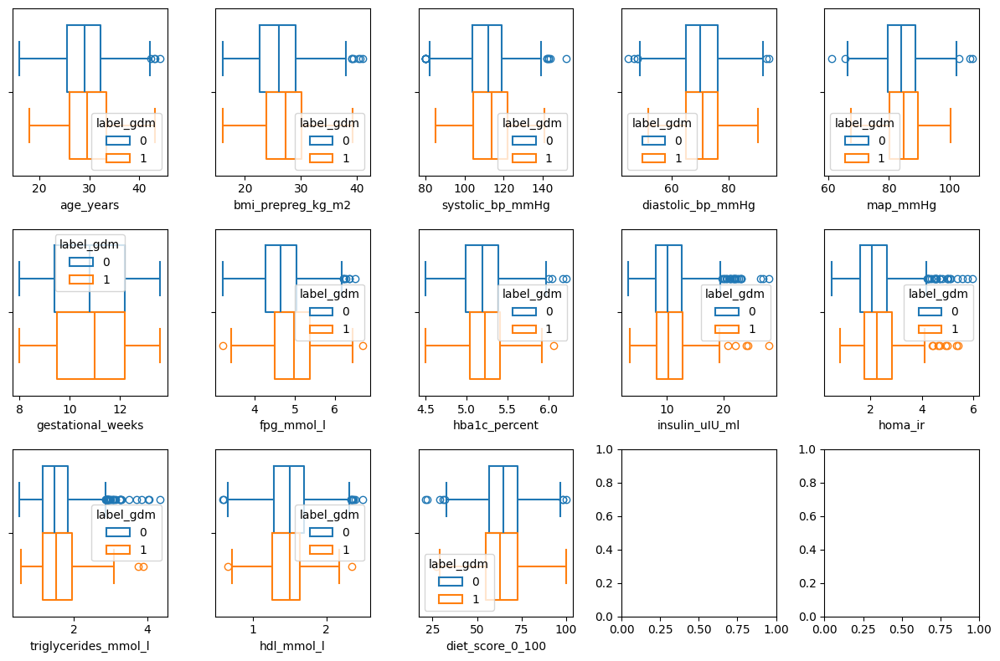

In [151]:
_, axis = plt.subplots(3,5, figsize=(12,8))

index=1
i=0
j=0

for column in df_statistical["descriptor"].values:
    sns.boxplot(
        data=df_filter, 
        x=column, 
        fill=False, 
        hue="label_gdm", 
        ax=axis[i][j])

    if index%5==0:
        i+=1
        j=0
    else:
        j+=1
    
    index+=1

plt.tight_layout()

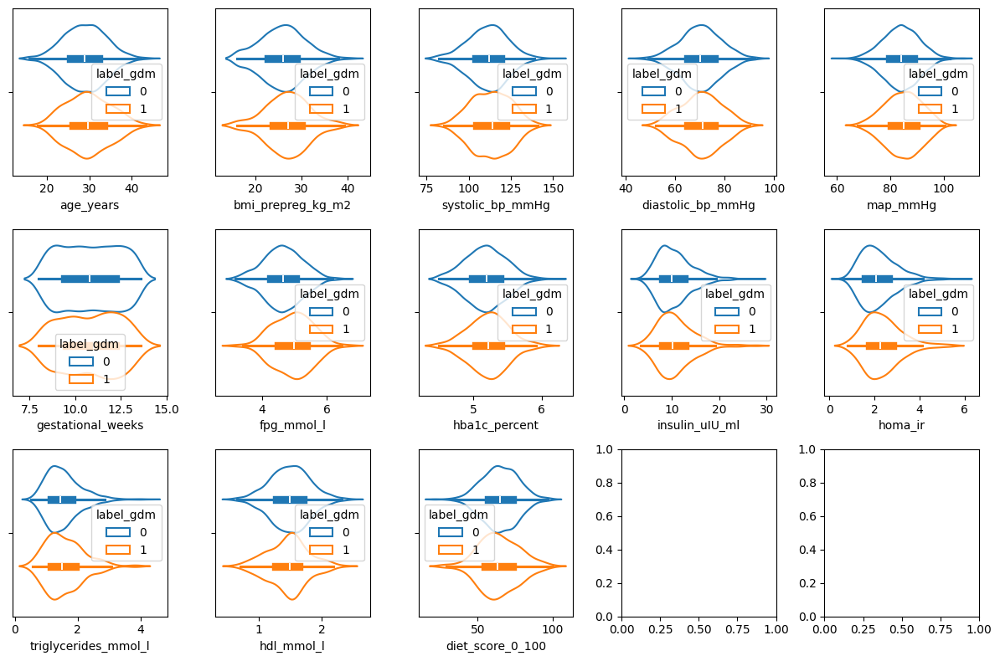

In [152]:
_, axis = plt.subplots(3,5, figsize=(12,8))

index=1
i=0
j=0

for column in df_statistical["descriptor"].values:
    sns.violinplot(
        data=df_filter, 
        x=column, 
        fill=False, 
        hue="label_gdm", 
        ax=axis[i][j])

    if index%5==0:
        i+=1
        j=0
    else:
        j+=1
    
    index+=1

plt.tight_layout()

- An ́alisis bivariado

In [153]:
df_filter.columns

Index(['age_years', 'bmi_prepreg_kg_m2', 'systolic_bp_mmHg',
       'diastolic_bp_mmHg', 'map_mmHg', 'gestational_weeks', 'fpg_mmol_l',
       'hba1c_percent', 'insulin_uIU_ml', 'homa_ir', 'triglycerides_mmol_l',
       'hdl_mmol_l', 'parity', 'family_history_t2d', 'previous_gdm', 'pcos',
       'smoking_first_trimester', 'physical_activity_level',
       'diet_score_0_100', 'label_gdm', 'is_outlier_by_IQR',
       'is_outlier_by_IF_all', 'is_outlier_by_IF_just_values',
       'is_outlier_by_IF_just_cat', 'vote_outlier'],
      dtype='object')

In [154]:
columns_to_ignore

['parity',
 'family_history_t2d',
 'previous_gdm',
 'pcos',
 'smoking_first_trimester',
 'label_gdm',
 'physical_activity_level']

In [155]:
df_filter = df_filter.drop(columns=['is_outlier_by_IQR',
       'is_outlier_by_IF_all', 'is_outlier_by_IF_just_values',
       'is_outlier_by_IF_just_cat', 'vote_outlier', 'parity',
 'family_history_t2d',
 'previous_gdm',
 'pcos',
 'smoking_first_trimester',
 'physical_activity_level'] )


In [157]:
df_corr_pearson = df_filter.drop(columns=["label_gdm"]).corr(method="pearson")
df_corr_spearman = df_filter.drop(columns=["label_gdm"]).corr(method="spearman")

<Axes: >

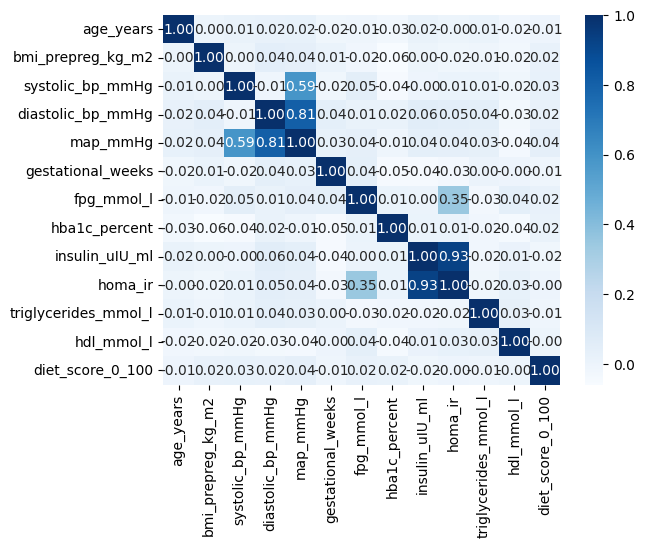

In [160]:
sns.heatmap(data=df_corr_pearson, annot=True, fmt=".2f", cmap="Blues")

In [161]:
df_corr_pearson_pos = df_filter[df_filter["label_gdm"] == 1].corr(method="pearson")
df_corr_pearson_neg = df_filter[df_filter["label_gdm"] == 0].corr(method="pearson")


<Axes: >

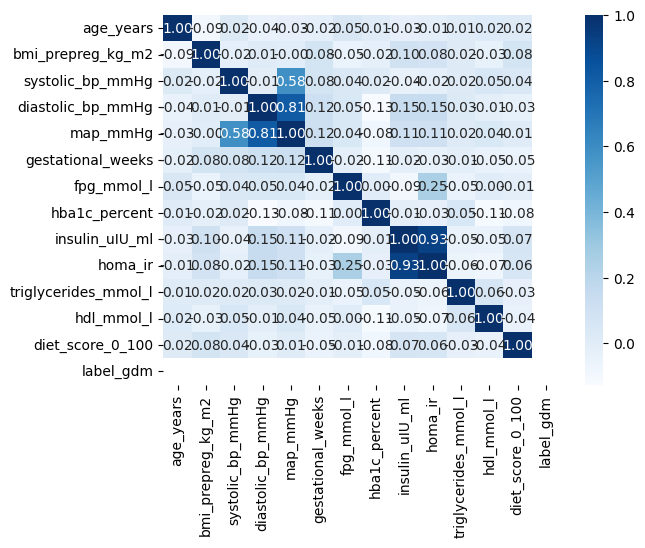

In [162]:
sns.heatmap(data=df_corr_pearson_pos, annot=True, fmt=".2f", cmap="Blues")

<Axes: >

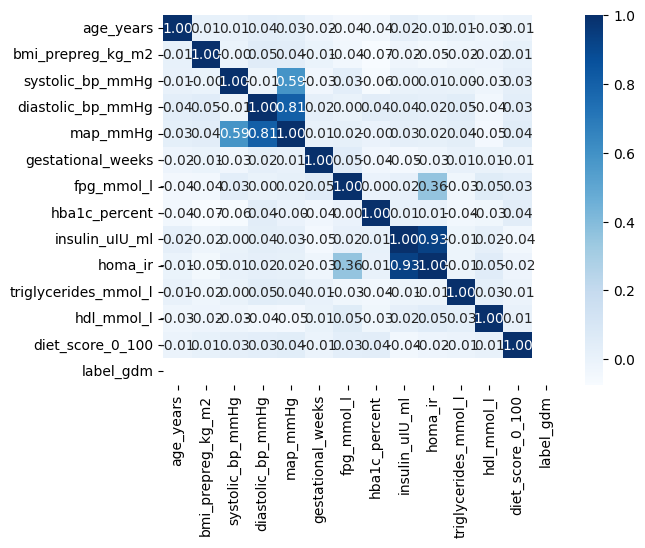

In [163]:
sns.heatmap(data=df_corr_pearson_neg, annot=True, fmt=".2f", cmap="Blues")

<Axes: >

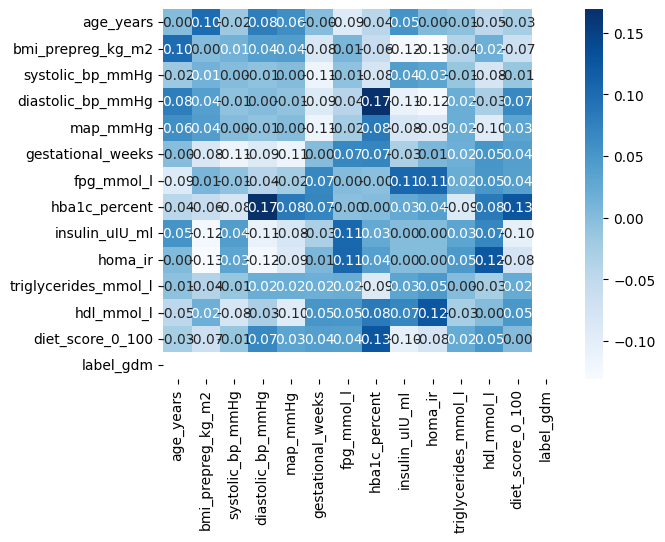

In [164]:
sns.heatmap(data=df_corr_pearson_neg-df_corr_pearson_pos, annot=True, fmt=".2f", cmap="Blues")

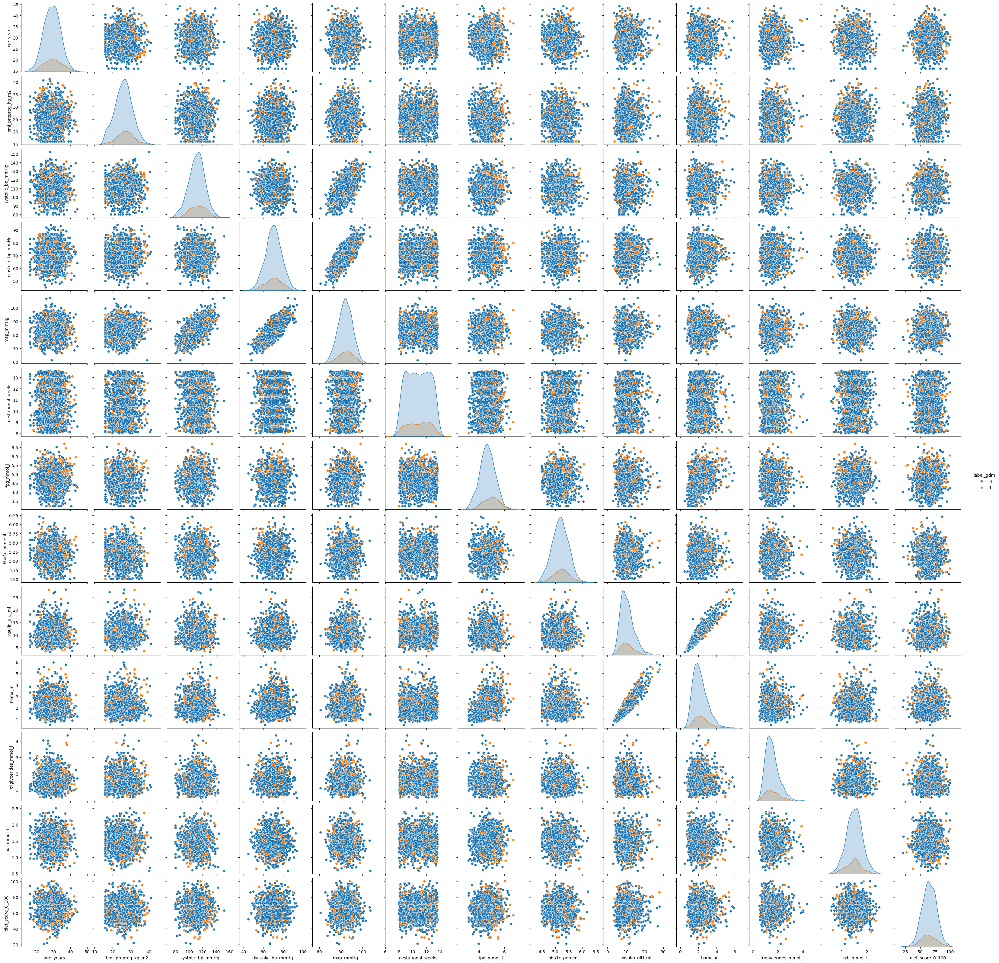

In [156]:
sns.pairplot(data=df_filter, hue="label_gdm")